# **Flight Data Analysis**

### *This notebook analyzes a large flight dataset (~300k entries) to uncover trends in pricing, duration, stops, airlines, and routes. Prices will be converted from INR to GBP using a live exchange rate API*

# **LOAD DATASET**

*The dataset includes airline, flight number, source/destination cities, departure/arrival times, class, duration, stops, days_left, and price in INR*

In [4]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import requests
from getpass import getpass

# Optional: for better visuals
sns.set(style="whitegrid")

In [5]:
# Load dataset
df = pd.read_csv('/content/flight.csv')

# Quick look
df.head()
df.info()
df.describe()
df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300153 entries, 0 to 300152
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   airline           300153 non-null  object 
 1   flight            300153 non-null  object 
 2   source_city       300153 non-null  object 
 3   departure_time    300153 non-null  object 
 4   stops             300153 non-null  object 
 5   arrival_time      300153 non-null  object 
 6   destination_city  300153 non-null  object 
 7   class             300153 non-null  object 
 8   duration          300153 non-null  float64
 9   days_left         300153 non-null  int64  
 10  price             300153 non-null  int64  
dtypes: float64(1), int64(2), object(8)
memory usage: 25.2+ MB


,0
airline,0
flight,0
source_city,0
departure_time,0
stops,0
arrival_time,0
destination_city,0
class,0
duration,0
days_left,0


# **Convert Prices to GBP via API**

*All flight prices have been converted from INR to GBP using the live exchange rate*

In [6]:
# Enter your API key securely
api_key = getpass("Enter your ExchangeRate-API key: ")

# API endpoint to get latest rates (INR → GBP)
url = f'https://v6.exchangerate-api.com/v6/{api_key}/latest/INR'

response = requests.get(url)
data = response.json()

# Extract INR → GBP rate
inr_to_gbp = data['conversion_rates']['GBP']
print("Current INR to GBP rate:", inr_to_gbp)

Enter your ExchangeRate-API key: ··········
Current INR to GBP rate: 0.008327


In [10]:
# Convert flight price and price per hour
df['price_gbp'] = df['price'] * inr_to_gbp
df['price_per_hour'] = df['price'] / df['duration']  # original
df['price_per_hour_gbp'] = df['price_per_hour'] * inr_to_gbp

df[['price','price_gbp','price_per_hour','price_per_hour_gbp']].head()

,price,price_gbp,price_per_hour,price_per_hour_gbp
0,5953,49.570631,2743.317972,22.843609
1,5953,49.570631,2554.935622,21.274949
2,5956,49.595612,2744.700461,22.855121
3,5955,49.587285,2646.666667,22.038793
4,5955,49.587285,2555.793991,21.282097


# **Data Preprocessing**

*Dataset is cleaned, categorical times are ordered, stops are numeric, and unrealistic entries are removed*

In [14]:
# Encode stops as numeric
df['stops'] = df['stops'].replace({'zero':0, 'one':1, 'two_or_more':2})

# Convert numeric columns
df['duration'] = pd.to_numeric(df['duration'], errors='coerce')
df['days_left'] = pd.to_numeric(df['days_left'], errors='coerce')

# Convert departure and arrival times to ordered categorical
time_order = ['early_morning', 'morning', 'afternoon', 'evening', 'night', 'late_night']
df['departure_time'] = pd.Categorical(df['departure_time'], categories=time_order, ordered=True)
df['arrival_time'] = pd.Categorical(df['arrival_time'], categories=time_order, ordered=True)

# Optional: map times to numeric for modeling
time_mapping = {time: i for i, time in enumerate(time_order)}
df['departure_time_num'] = df['departure_time'].map(time_mapping)
df['arrival_time_num'] = df['arrival_time'].map(time_mapping)

# Filter unrealistic values
df = df[(df['duration']>0) & (df['price']>0)]


# **Exploratory Data Analysis (EDA)**

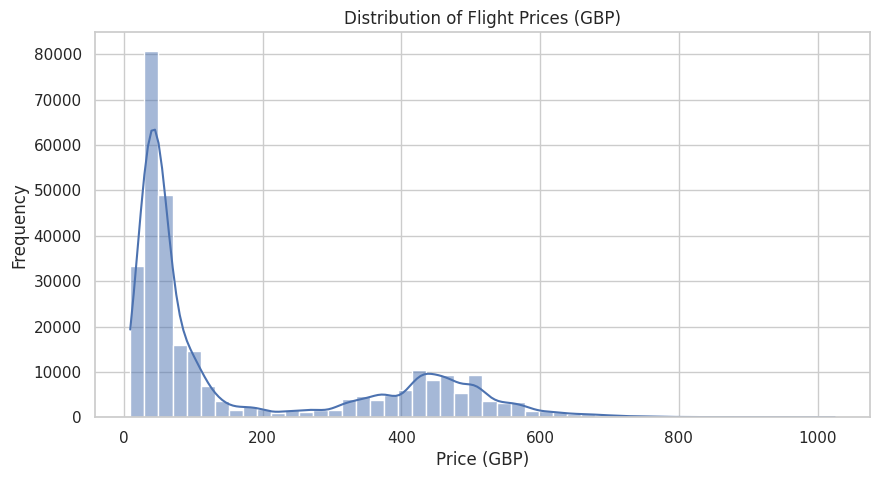

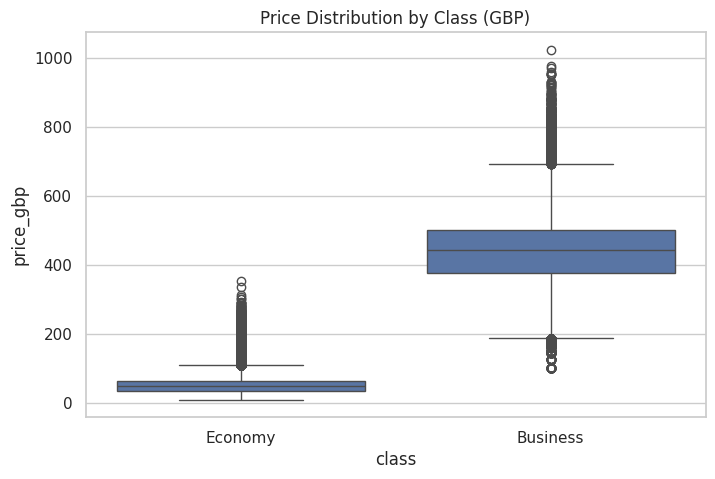

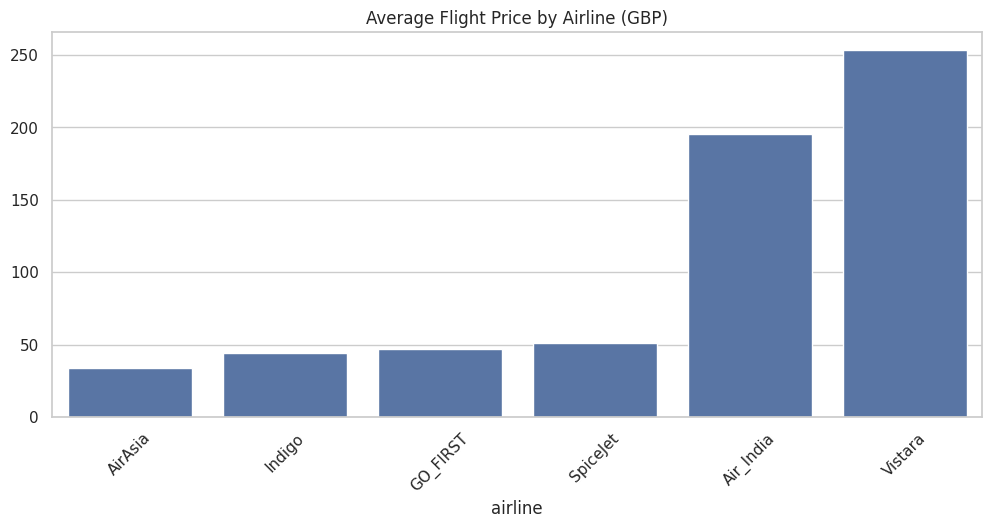

In [16]:
# Histogram: Price (GBP)
plt.figure(figsize=(10,5))
sns.histplot(df['price_gbp'], bins=50, kde=True)
plt.title('Distribution of Flight Prices (GBP)')
plt.xlabel('Price (GBP)')
plt.ylabel('Frequency')
plt.show()

# Boxplot: Price by class
plt.figure(figsize=(8,5))
sns.boxplot(x='class', y='price_gbp', data=df)
plt.title('Price Distribution by Class (GBP)')
plt.show()

# Avg price by airline
avg_price_airline = df.groupby('airline')['price_gbp'].mean().sort_values()
plt.figure(figsize=(12,5))
sns.barplot(x=avg_price_airline.index, y=avg_price_airline.values)
plt.xticks(rotation=45)
plt.title('Average Flight Price by Airline (GBP)')
plt.show()


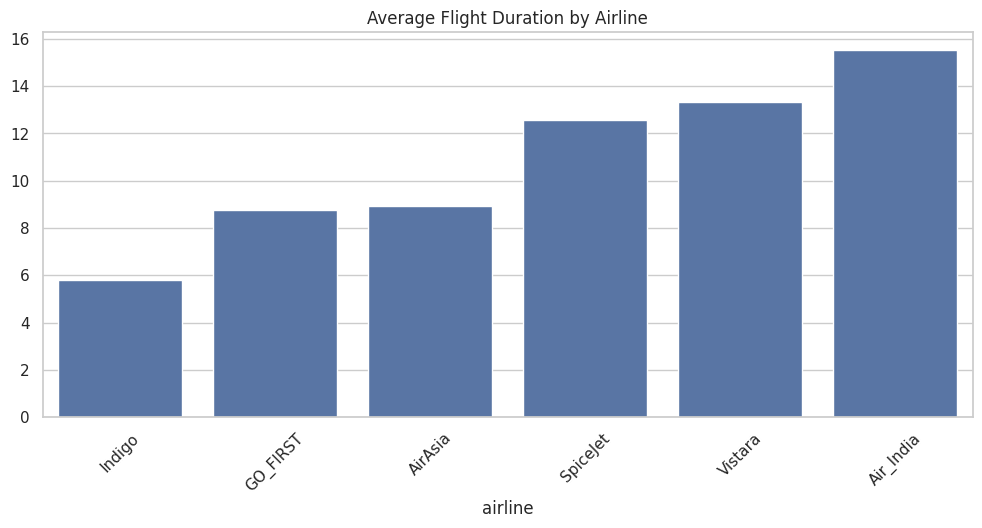

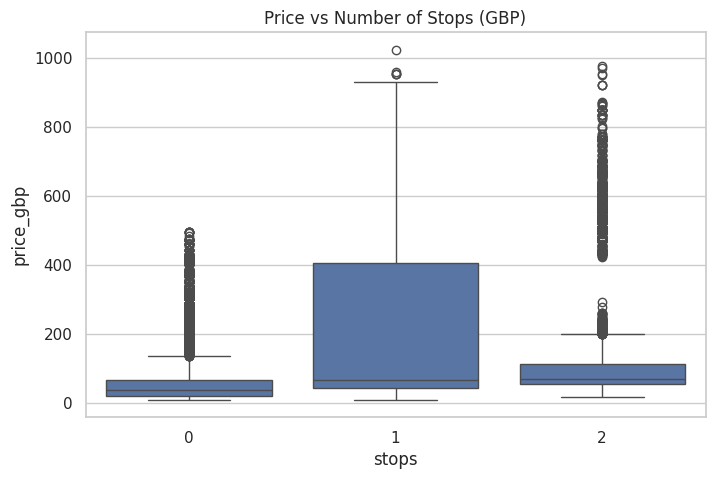

In [17]:
# Avg duration by airline
avg_duration = df.groupby('airline')['duration'].mean().sort_values()
plt.figure(figsize=(12,5))
sns.barplot(x=avg_duration.index, y=avg_duration.values)
plt.xticks(rotation=45)
plt.title('Average Flight Duration by Airline')
plt.show()

# Stops vs Price
plt.figure(figsize=(8,5))
sns.boxplot(x='stops', y='price_gbp', data=df)
plt.title('Price vs Number of Stops (GBP)')
plt.show()


source_city  destination_city
Delhi        Mumbai              15289
Mumbai       Delhi               14809
Delhi        Bangalore           14012
Bangalore    Delhi               13756
             Mumbai              12939
Mumbai       Bangalore           12885
             Kolkata             12602
Delhi        Kolkata             11934
Kolkata      Mumbai              11467
Delhi        Chennai             10780
dtype: int64


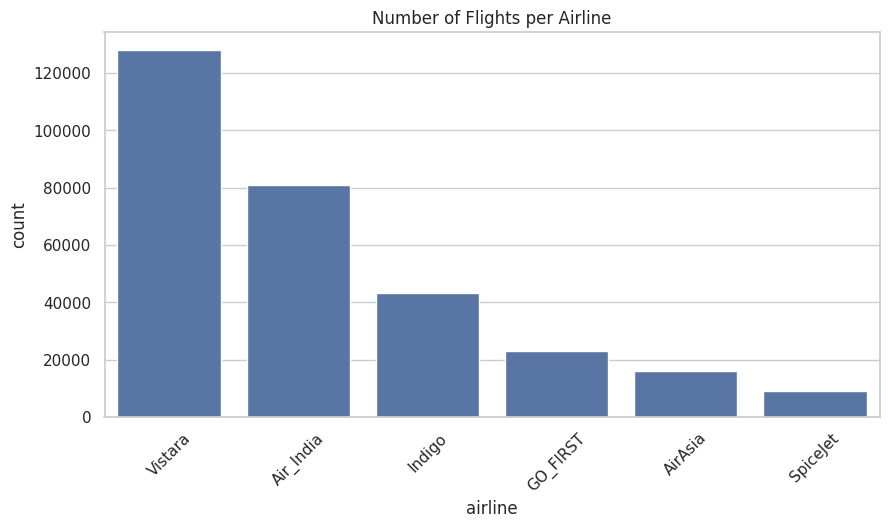

In [18]:
# Top 10 source-destination pairs
top_routes = df.groupby(['source_city','destination_city']).size().sort_values(ascending=False).head(10)
print(top_routes)

# Airline market share
plt.figure(figsize=(10,5))
sns.countplot(x='airline', data=df, order=df['airline'].value_counts().index)
plt.xticks(rotation=45)
plt.title('Number of Flights per Airline')
plt.show()


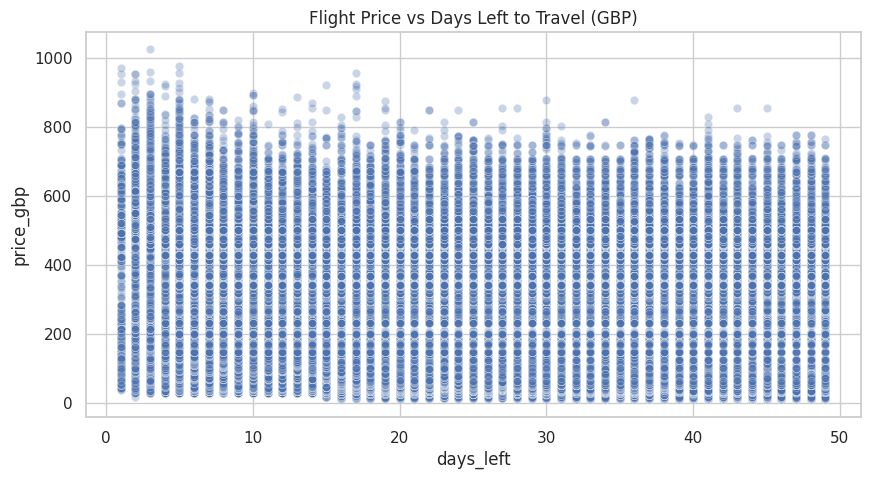

In [22]:


# Days left vs Price
plt.figure(figsize=(10,5))
sns.scatterplot(x='days_left', y='price_gbp', alpha=0.3, data=df)
plt.title('Flight Price vs Days Left to Travel (GBP)')
plt.show()


# **Interactive Visualizations (Plotly)**

In [23]:
# Avg price by airline
fig = px.bar(df.groupby('airline')['price_gbp'].mean().reset_index(), x='airline', y='price_gbp', title='Average Flight Price by Airline (GBP)')
fig.show()

# Duration vs Price colored by stops
fig = px.scatter(df, x='duration', y='price_gbp', color='stops', hover_data=['airline','source_city','destination_city'], title='Duration vs Price (GBP)')
fig.show()

# Top expensive routes
top_routes_df = df.groupby(['source_city','destination_city'])['price_gbp'].mean().reset_index().sort_values(by='price_gbp', ascending=False).head(15)
fig = px.bar(top_routes_df, x='source_city', y='price_gbp', color='destination_city', title='Top Expensive Routes (GBP)')
fig.show()


# **Price Prediction Model (GBP)**

In [24]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Select features and target
features = ['airline','source_city','destination_city','stops','class','duration','days_left','departure_time_num','arrival_time_num']
target = 'price_gbp'

# One-hot encode categorical features
df_model = pd.get_dummies(df[features + [target]], drop_first=True)

X = df_model.drop(target, axis=1)
y = df_model[target]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [25]:
# Initialize model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)

# Train
rf_model.fit(X_train, y_train)

RandomForestRegressor(n_jobs=-1, random_state=42)

In [26]:
from sklearn.metrics import mean_squared_error
import numpy as np

# Predict
y_pred = rf_model.predict(X_test)

# RMSE using sqrt
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

# R² score
from sklearn.metrics import r2_score
r2 = r2_score(y_test, y_pred)

print(f"RMSE: {rmse:.2f} GBP")
print(f"R² Score: {r2:.3f}")

RMSE: 27.55 GBP
R² Score: 0.979


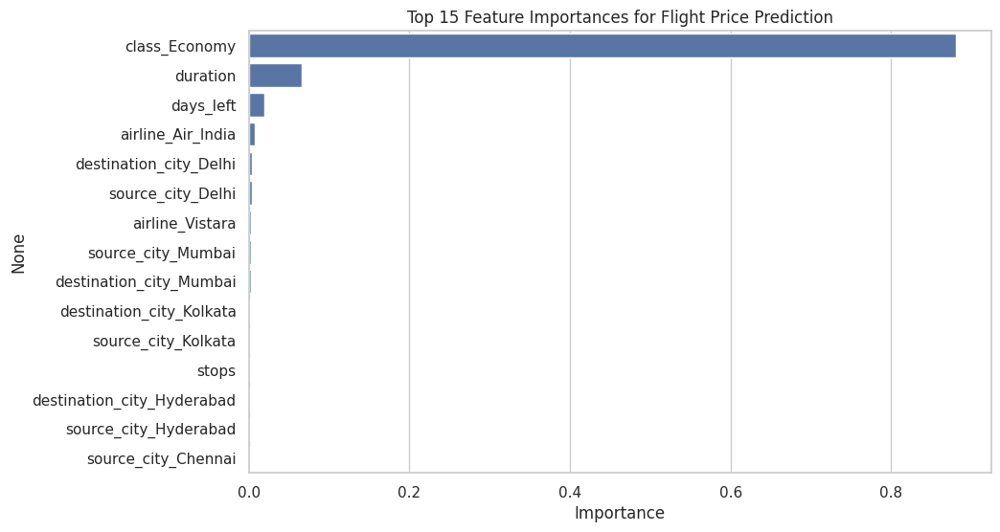

In [27]:
importances = pd.Series(rf_model.feature_importances_, index=X.columns)
top_features = importances.sort_values(ascending=False).head(15)

# Plot top features
plt.figure(figsize=(10,6))
sns.barplot(x=top_features.values, y=top_features.index)
plt.title('Top 15 Feature Importances for Flight Price Prediction')
plt.xlabel('Importance')
plt.show()

In [28]:
# Example: new flight input
new_flight = pd.DataFrame({
    'airline': ['SpiceJet'],
    'source_city': ['Delhi'],
    'destination_city': ['Mumbai'],
    'stops': [0],
    'class': ['Economy'],
    'duration': [2.17],
    'days_left': [5],
    'departure_time_num': [3],  # evening
    'arrival_time_num': [4]     # night
})

# One-hot encode new flight with same columns
new_flight_encoded = pd.get_dummies(new_flight).reindex(columns=X.columns, fill_value=0)

# Predict
predicted_price = rf_model.predict(new_flight_encoded)
print(f"Predicted Flight Price (GBP): {predicted_price[0]:.2f}")


Predicted Flight Price (GBP): 49.72


In [29]:
print(f"Mean Price: {y.mean():.2f} GBP")
print(f"Median Price: {y.median():.2f} GBP")


Mean Price: 173.95 GBP
Median Price: 61.83 GBP


In [30]:
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
print(f"MAPE: {mape:.2f}%")


MAPE: 8.88%


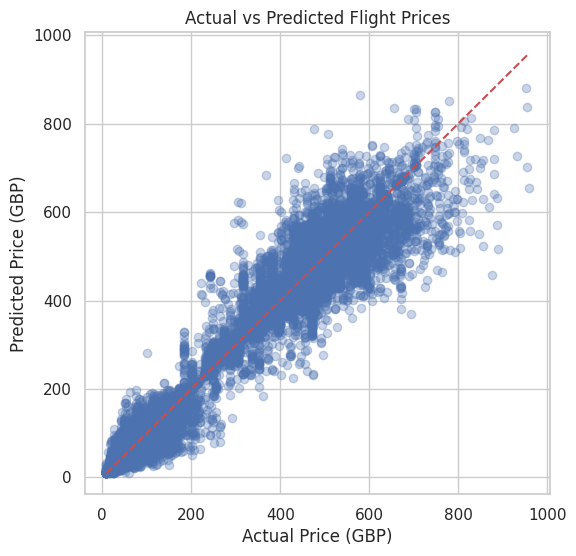

In [31]:
plt.figure(figsize=(6,6))
plt.scatter(y_test, y_pred, alpha=0.3)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual Price (GBP)")
plt.ylabel("Predicted Price (GBP)")
plt.title("Actual vs Predicted Flight Prices")
plt.show()


# ***README***

In [32]:
%%writefile README.md

# ✈️ Flight Price Prediction (India → GBP Conversion)

## Overview
This project analyzes a dataset of **~300,000 domestic flight records** from India.
The main goal is to **explore flight pricing patterns** and **predict flight prices** using machine learning.

All prices have been converted from **INR → GBP** for international relevance.

The project demonstrates a complete **data science workflow** in a single notebook, including:

- Data cleaning and preprocessing
- Currency conversion
- Exploratory Data Analysis (EDA)
- Predictive modeling using Random Forest Regression
- Evaluation and interpretation of results

---

## Dataset
- **Rows:** ~300,000 flight entries
- **Columns include:**
    - `airline`: Airline name
    - `flight`: Flight number
    - `source_city` / `destination_city`
    - `departure_time` / `arrival_time`
    - `stops`: Number of stops (0,1,2+)
    - `class`: Economy, Business, etc.
    - `duration`: Flight duration (hours)
    - `days_left`: Days until departure
    - `price`: Original INR price

**Data Cleaning & Preprocessing:**
- Converted categorical times (`departure_time` / `arrival_time`) to ordered numeric values
- Encoded categorical variables for modeling
- Removed invalid rows (zero duration or price)
- Converted prices from INR → GBP using ExchangeRate-API

---

## Exploratory Data Analysis (EDA)
Key insights from the dataset:

- **Price Distribution:** Most flights are mid-range, with some high-priced outliers
- **Class Impact:** Business/First class flights are significantly more expensive than Economy
- **Stops:** More stops generally lead to higher prices and longer durations
- **Airline Variation:** Some airlines are consistently cheaper or more expensive
- **Booking Timing:** Flights booked closer to departure tend to cost more
- **Departure/Arrival Times:** Evening/night flights are slightly more expensive

Visualizations such as histograms, boxplots, and scatterplots are included in the notebook.

---

## Predictive Modeling

**Model Used:** Random Forest Regressor

**Features Used:**
- Airline, source/destination city, stops, class, duration, days_left
- Departure and arrival times (numeric encoding)

**Training:** 80% train / 20% test split

**Performance Metrics:**
- **R² = 0.979** → 97.9% of variance explained
- **RMSE = £27.55** → ~16% of mean ticket price (£173.95)
- **MAPE = 8.88%** → Predictions are within ~9% of actual prices on average

**Feature Importance:**
- Most important features: duration, stops, class, airline, and days_left

---

## Tech Stack
- Python libraries: Pandas, NumPy, Scikit-learn, Matplotlib, Seaborn, Plotly, Requests
- Environment: Google Colab / Jupyter Notebook
- API: ExchangeRate-API for INR → GBP conversion

---

## How to Run

1. Open the notebook file:


Writing README.md
